## Fundamental extraction example

Use maelzel.snd.audiosample.Sample to load and manipulate an audio soundfile. A Sample can play itself (using csoundengine), has a nice html representation in jupyter with a waveform and browser playback.

In [1]:
from maelzel.snd import audiosample
import numpy as np
from emlib import numpytools

Sample: dur=20.000000 sr=44100 ch=2
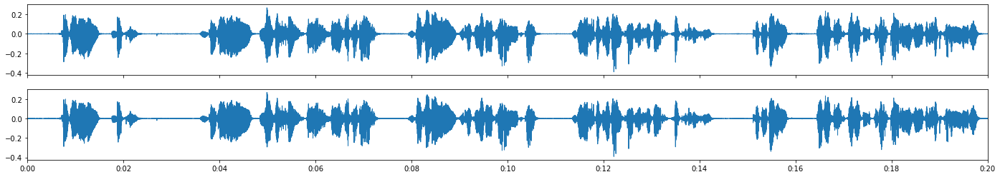

In [2]:
s = audiosample.Sample("istambul2.flac")
s

### Extract the fundamental of and plot it against the spectrogram

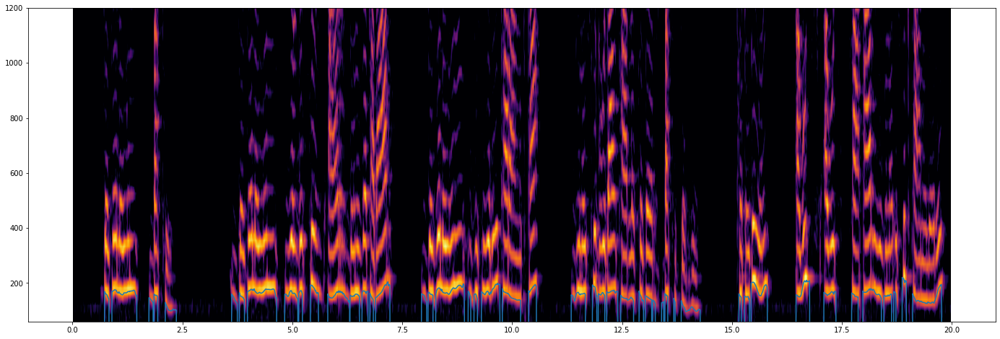

Sampled[0.0:19.998187105]

In [3]:
f0 = s.fundamentalBpf(fftsize=2048, overlap=8, method='pyin')
axes = s.plotSpectrogram(maxfreq=1200, minfreq=60, fftsize=2048, overlap=4, mindb=-80)
f0.plot(n=1000, axes=axes)

## Play the fundamental

Get the csound Engine used by `audiosample`, since sample playback needs to be choordinated with the fundamental playback

In [4]:
e = audiosample.getPlayEngine()
e

csoundengine.magic extension loaded
Magics available: %csound, %%csound, %%definstr
options ['-d', '-+rtaudio=jack', '-odac:Built-in Audio Pro:', '-iadc:Built-in Audio Pro:', '-b512', '-B1024', '-m0', '-d', '-+jack_client=csoundengine.engine0']


Engine(name=engine0, sr=48000, backend=jack, outdev=dac:Built-in Audio Pro:, nchnls=4, indev=adc:Built-in Audio Pro:, nchnls_i=2, bufferSize=512)

Create an instr to play back the extracted fundamental as a square wave

In [5]:
session = e.session()
session.defInstr('vco', r'''
  |kfreq=200, kamp=0.1, igain=0.1, ichan=1|
  asig vco2 1, kfreq
  asig *= a(lag:k(kamp*igain, 0.01))
  outch ichan, asig
''')

Instr(vco, kfreq:5=200.0, kamp:6=0.1, igain:7=0.1, ichan:8=1.0)

In [6]:
amp = f0 > 70
xs, freqs = f0.points()
freqpairs = numpytools.interlace(xs, freqs)
amppairs = numpytools.interlace(xs, amp.map(xs))

### Play sample and fundamental simultaneously

When scheduling multiple events which need to be in sync with each other,
it is recommended to encapsulate all in a `lockedElapsedTime` block. Within 
such a block, time is "frozen" so that events are scheduled in the future using
the same reference time. Without this, the time it takes to schedule events
might lead to events falling out of sync

In [21]:
with e.lockedElapsedTime():
    s.play(delay=1024/e.sr, pan=0)
    f0synth = session.sched('vco', dur=s.duration+0.1, kamp=0, ichan=2)
    f0synth.automatep('kfreq', freqpairs)
    f0synth.automatep('kamp', amppairs)

### Render to a soundfile

When rendering offline, no encapsulation is needed. Besides that, the code is exactly the same for live and offline rendering

In [7]:
# Make an offline renderer based on the instrument definitions of the current session. 
r = session.makeRenderer(sr=e.sr, nchnls=2)

r.playSample(s.getChannel(0).samples, sr=s.sr, delay=1024/r.sr, chan=1) 
f0synth = r.sched('vco', dur=s.duration+0.1, kamp=0, ichan=2)
f0synth.automatep('kfreq', freqpairs)
f0synth.automatep('kamp', amppairs)

r.render("fundamental.wav", quiet=True, openWhenDone=True)

Gtk-Message: 10:11:36.287: Failed to load module "atk-bridge"
/home/em/.mhwaveedit/config: Expected value: mixerUtility

(mhwaveedit:76326): GLib-CRITICAL **: 10:11:36.320: Failed to set scheduler settings: Operation not permitted


'fundamental.wav'

Sample: dur=20.100000 sr=48000 ch=2
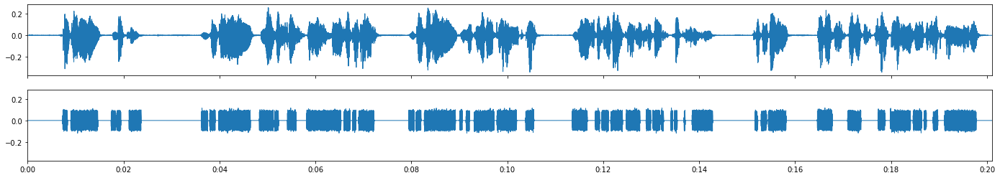

In [9]:
f0 = audiosample.Sample("fundamental.wav")
f0

In [13]:
from IPython.display import Audio
Audio('fundamental.wav')